In [1]:
# Import python libraries
import matplotlib.pyplot as plt; plt.rcdefaults()
%matplotlib inline
import numpy as np
import pandas as pd

In [2]:
# Read csv file
df = pd.read_csv('london.csv')

In [3]:
df

,Borough,Major Category,202201,202202,202203,202204,202205,202206,202207,202208,202209,202210,202211,202212
0,Barking and Dagenham,Arson and Criminal Damage,2379,3641,2334,2823,3859,2785,4767,520,3682,1513,4290,2211
1,Barking and Dagenham,Burglary,3716,4144,3949,4485,4775,1616,1975,2327,589,2872,3899,4082
2,Barking and Dagenham,Drug Offences,3530,2831,4644,840,395,3514,3630,2194,4602,791,1395,49
3,Barking and Dagenham,Miscellaneous Crimes Against Society,3253,4271,4447,893,2109,2080,1603,168,1774,4326,4613,124
4,Barking and Dagenham,Possession of Weapons,4347,2392,3040,3747,940,3076,1369,1426,4873,4270,2949,3346
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
315,Westminster,Public Order Offences,2777,2644,35,1585,1591,2310,3446,2285,3313,4989,3200,405
316,Westminster,Robbery,415,2005,3709,3333,2471,4876,3107,309,3106,638,1505,4845
317,Westminster,Theft,4017,190,4037,1656,2969,4258,428,1418,1216,3045,4445,2328
318,Westminster,Vehicle Offences,693,2324,882,4411,1387,2410,3263,65,124,2104,3501,2140


In [4]:
# Get data year range
months = [str(i) for i in range(202201, 202213)]

In [5]:
# Get unique values of offence column
offence = df['Major Category'].unique()
offence

array(['Arson and Criminal Damage', 'Burglary', 'Drug Offences',
       'Miscellaneous Crimes Against Society', 'Possession of Weapons',
       'Public Order Offences', 'Robbery', 'Theft', 'Vehicle Offences',
       'Violence Against the Person'], dtype=object)

In [6]:
# Get unique values for borough column
borough = df['Borough'].unique()
borough

array(['Barking and Dagenham', 'Barnet', 'Bexley', 'Brent', 'Bromley',
       'Camden', 'Croydon', 'Ealing', 'Enfield', 'Greenwich', 'Hackney',
       'Hammersmith and Fulham', 'Haringey', 'Harrow', 'Havering',
       'Hillingdon', 'Hounslow', 'Islington', 'Kensington and Chelsea',
       'Kingston upon Thames', 'Lambeth', 'Lewisham', 'Merton', 'Newham',
       'Redbridge', 'Richmond upon Thames', 'Southwark', 'Sutton',
       'Tower Hamlets', 'Waltham Forest', 'Wandsworth', 'Westminster'],
      dtype=object)

C:\Users\dong\AppData\Local\Temp\ipykernel_4796\2019164563.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = (20, 10), dpi = 100, facecolor = 'w', edgecolor = 'k')


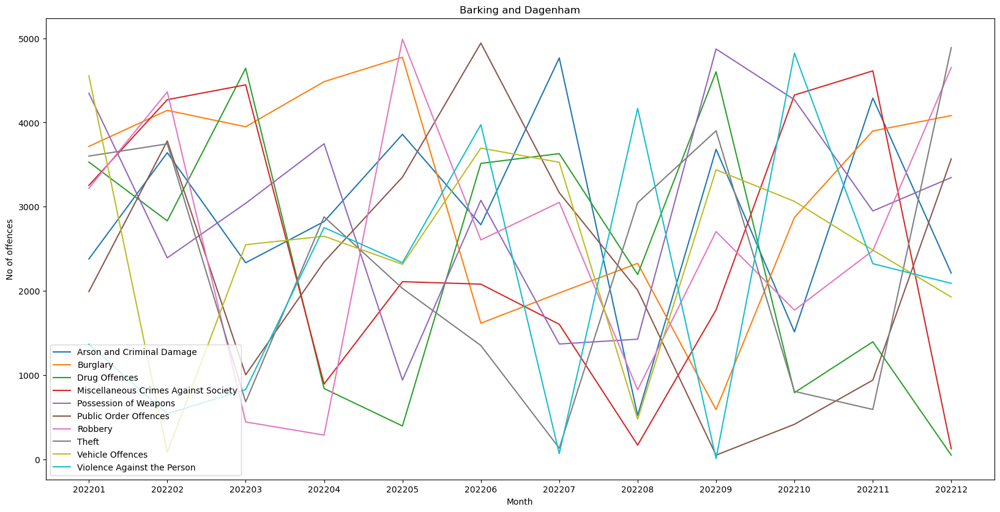

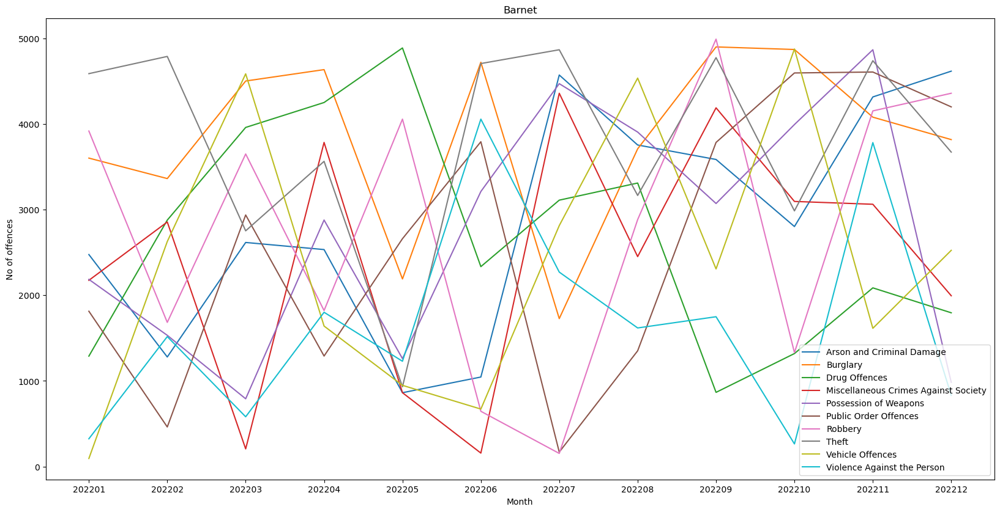

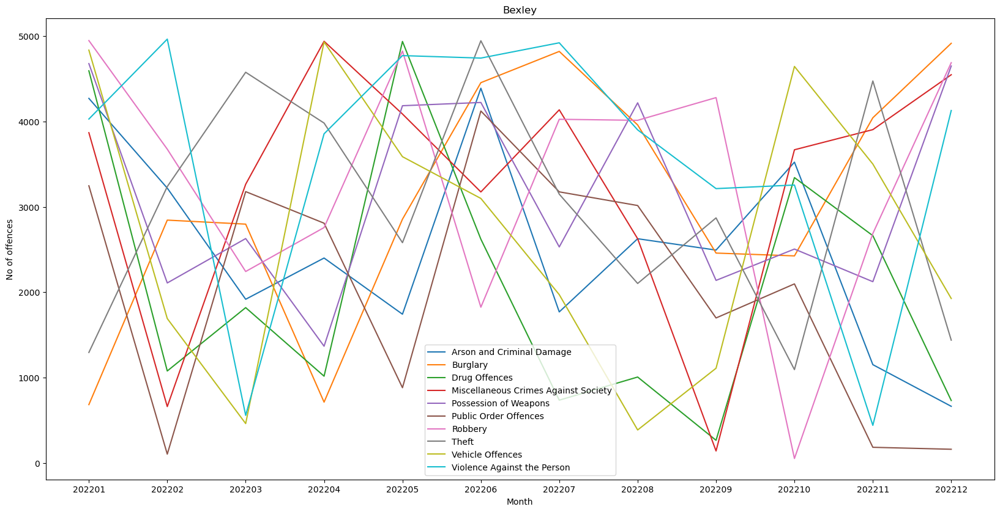

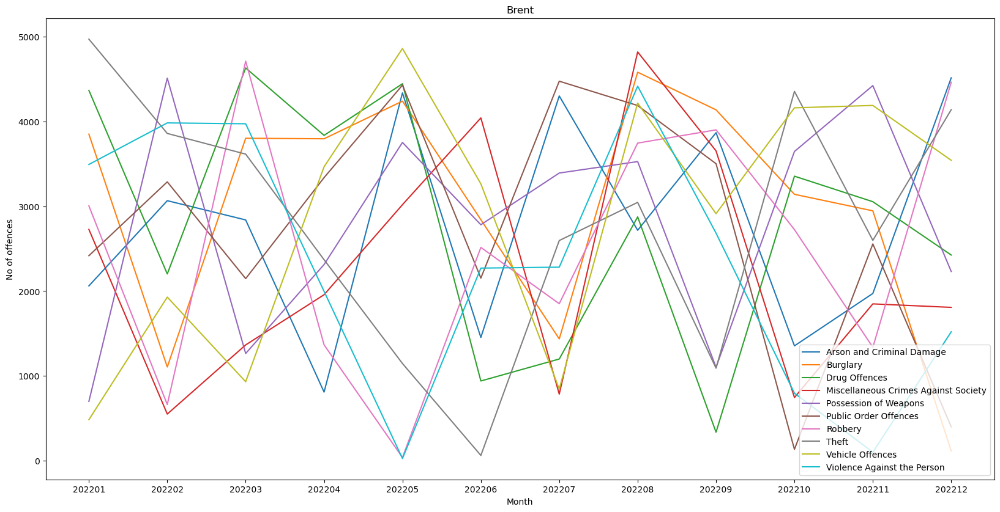

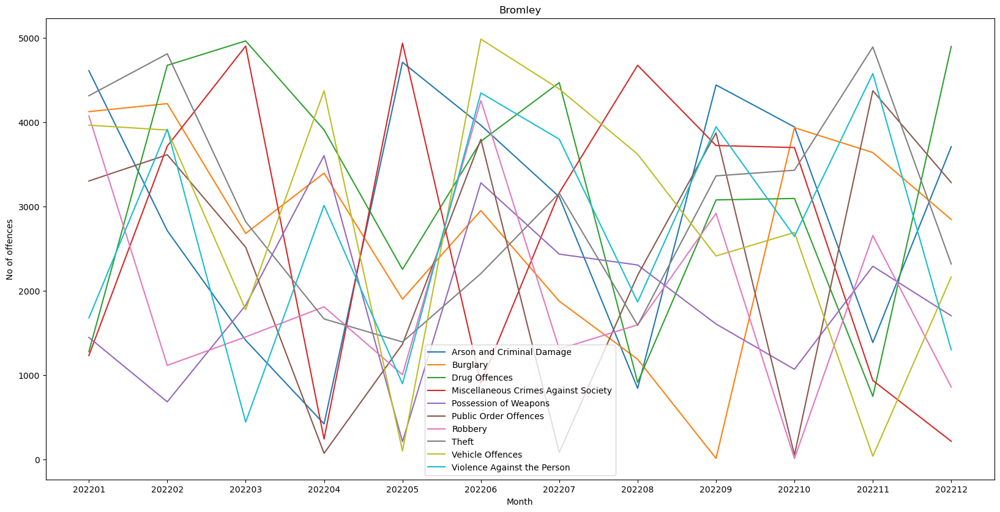

...

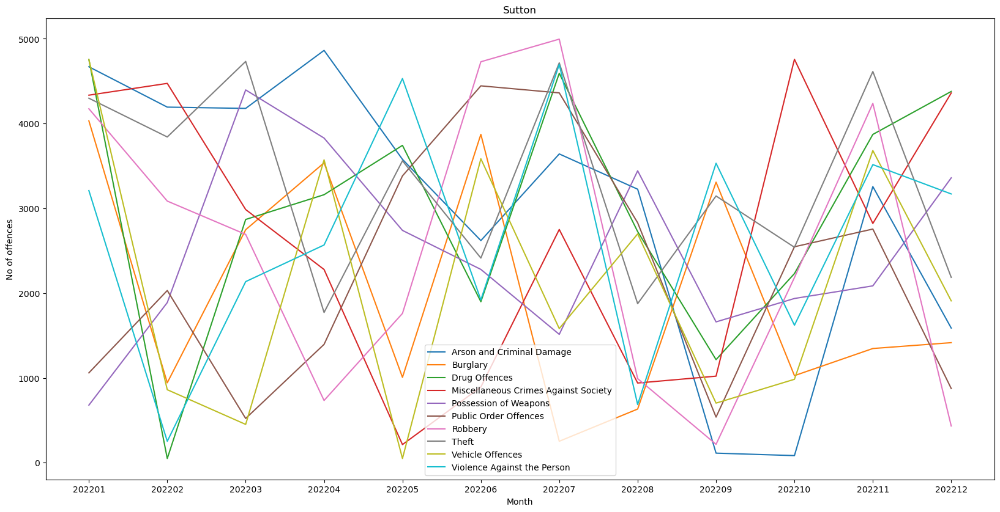

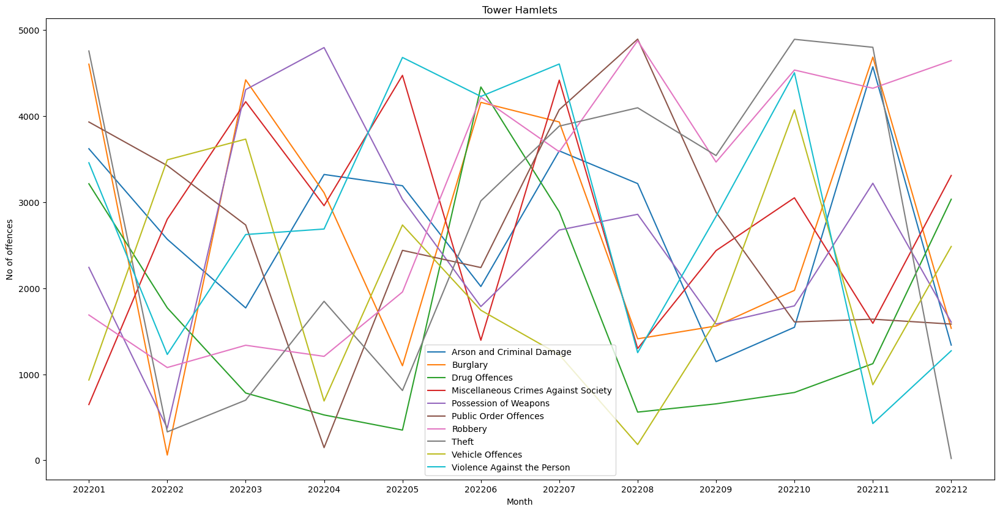

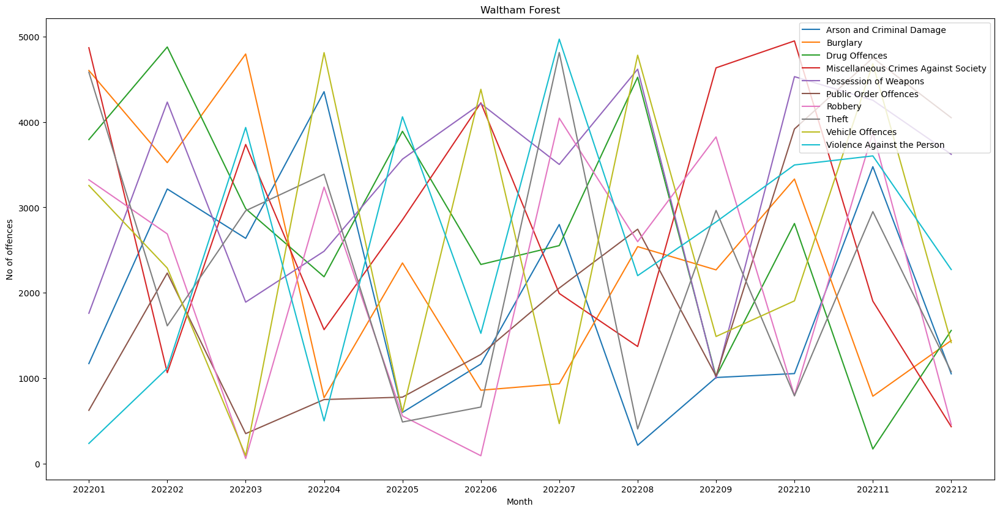

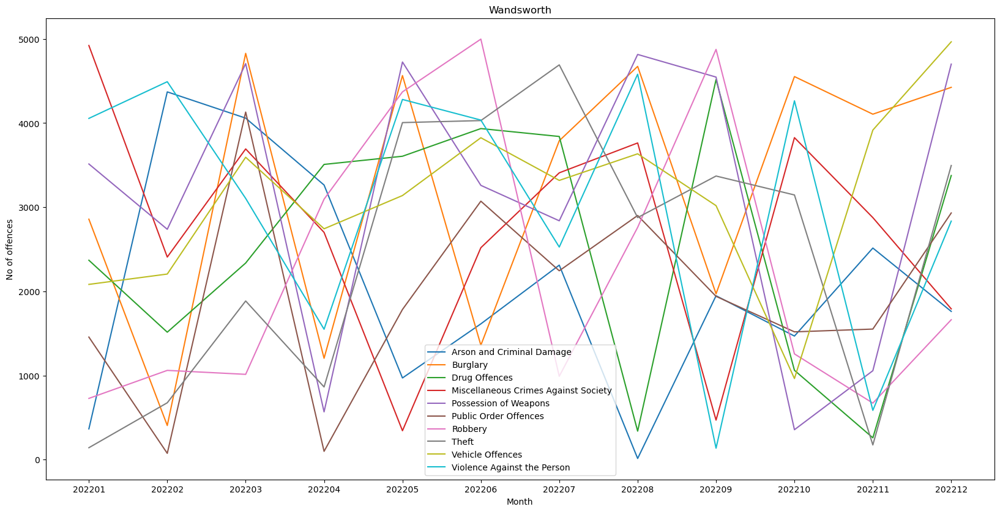

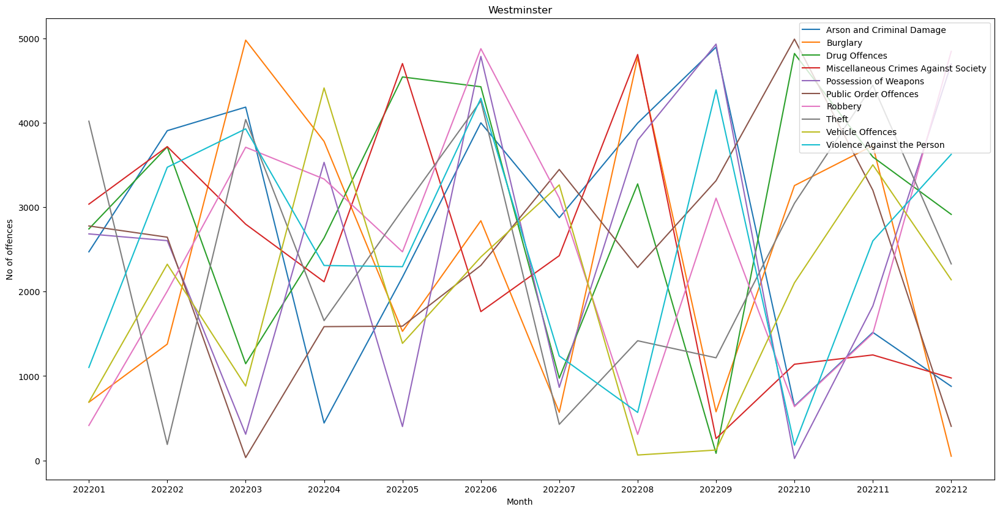

In [7]:
# Plot graph
for area in borough:
    fig = plt.figure(figsize = (20, 10), dpi = 100, facecolor = 'w', edgecolor = 'k')
    plt.title(area)
    plt.xlabel('Month')
    plt.ylabel('No of offences')
    for crime in offence:
        temp_df = df[(df['Borough'] == area) & (df['Major Category'] == crime)]
        n_crime = [temp_df[c].values[0] for c in months]
        plt.plot(months, n_crime)
        plt.legend(offence)

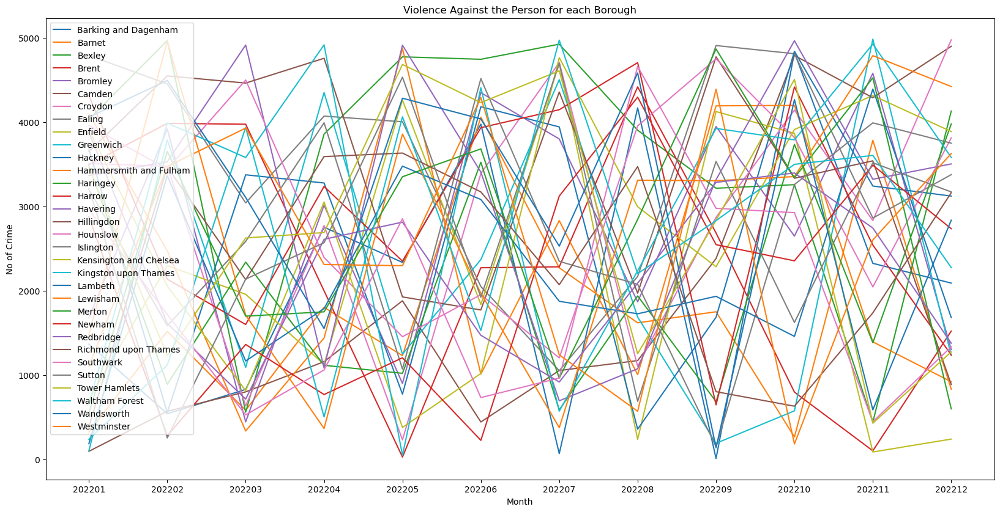

In [8]:
# Plot graph for a particular offence
fig = plt.figure(figsize = (20, 10), dpi = 100, facecolor = 'w', edgecolor = 'k')
plt.title('Violence Against the Person for each Borough')
plt.xlabel('Month')
plt.ylabel('No of Crime')
for area in borough:
    temp_df = df[(df['Borough'] == area) & (df['Major Category'] == 'Violence Against the Person')]
    n_crime = [temp_df[c].values[0] for c in months]
    plt.plot(months, n_crime)
    plt.legend(borough)

In [9]:
# Print out number of features
for c_name in df.columns:
    if df[c_name].dtypes == 'object':
        unique_cat = len(df[c_name].unique())
        print("'{c_name}' has {unique_cat} features".format(c_name = c_name, unique_cat = unique_cat))

'Borough' has 32 features
'Major Category' has 10 features


In [10]:
# Data Preprocessing
from sklearn import preprocessing

In [11]:
# Creating labels
lab = preprocessing.LabelEncoder()

In [12]:
# Scale the training data
df['Major Category'] = lab.fit_transform(df['Major Category'])

In [13]:
df.head()

,Borough,Major Category,202201,202202,202203,202204,202205,202206,202207,202208,202209,202210,202211,202212
0,Barking and Dagenham,0,2379,3641,2334,2823,3859,2785,4767,520,3682,1513,4290,2211
1,Barking and Dagenham,1,3716,4144,3949,4485,4775,1616,1975,2327,589,2872,3899,4082
2,Barking and Dagenham,2,3530,2831,4644,840,395,3514,3630,2194,4602,791,1395,49
3,Barking and Dagenham,3,3253,4271,4447,893,2109,2080,1603,168,1774,4326,4613,124
4,Barking and Dagenham,4,4347,2392,3040,3747,940,3076,1369,1426,4873,4270,2949,3346


In [14]:
# Using K-Means
from sklearn.cluster import KMeans

In [15]:
# Setting number of clusters
kmeans = KMeans(n_clusters = 10)

In [16]:
# Fitting the data
kmeans.fit(df.iloc[:,1:])

KMeans(n_clusters=10)

In [17]:
# Output clusters
kmeans.cluster_centers_

array([[5.16666667e+00, 2.81466667e+03, 1.78370000e+03, 1.69973333e+03,
        1.96240000e+03, 1.58106667e+03, 1.62943333e+03, 3.80096667e+03,
        3.01086667e+03, 3.41380000e+03, 3.51343333e+03, 3.73423333e+03,
        2.77443333e+03],
       [3.93750000e+00, 2.55025000e+03, 2.33781250e+03, 2.31803125e+03,
        3.23534375e+03, 3.43396875e+03, 3.07718750e+03, 2.42750000e+03,
        3.54315625e+03, 1.07512500e+03, 3.84015625e+03, 3.39187500e+03,
        3.44281250e+03],
       [4.36111111e+00, 2.15547222e+03, 3.35669444e+03, 2.98136111e+03,
        2.72213889e+03, 3.03925000e+03, 3.16652778e+03, 4.13113889e+03,
        2.65930556e+03, 2.93252778e+03, 1.68827778e+03, 1.96877778e+03,
        3.87027778e+03],
       [4.69696970e+00, 2.63684848e+03, 1.92312121e+03, 3.91857576e+03,
        2.55587879e+03, 2.27060606e+03, 3.42906061e+03, 1.17433333e+03,
        1.92915152e+03, 3.46012121e+03, 2.69418182e+03, 3.23657576e+03,
        3.41469697e+03],
       [5.07692308e+00, 1.63615385e+

In [18]:
# Apply labels to the clusters
labels = kmeans.labels_

In [19]:
labels

array([2, 1, 7, 8, 3, 2, 2, 4, 6, 1, 0, 3, 5, 0, 0, 3, 3, 2, 7, 9, 6, 2,
       6, 1, 1, 9, 2, 3, 6, 2, 2, 5, 5, 9, 1, 5, 3, 8, 1, 7, 6, 8, 2, 7,
       9, 4, 9, 8, 2, 4, 5, 5, 6, 9, 5, 8, 3, 0, 2, 0, 6, 2, 7, 8, 2, 9,
       7, 5, 7, 0, 7, 9, 8, 4, 8, 4, 7, 9, 8, 6, 2, 5, 4, 3, 5, 1, 8, 5,
       5, 7, 8, 9, 3, 1, 3, 9, 1, 3, 7, 8, 7, 0, 9, 4, 9, 1, 9, 5, 8, 8,
       8, 2, 4, 3, 1, 8, 9, 3, 7, 6, 8, 9, 5, 7, 0, 2, 7, 7, 4, 9, 5, 6,
       4, 4, 5, 2, 5, 8, 7, 1, 1, 3, 1, 2, 5, 7, 1, 9, 0, 3, 2, 0, 1, 8,
       9, 7, 8, 6, 6, 8, 7, 4, 6, 6, 4, 7, 0, 7, 4, 3, 7, 2, 0, 0, 3, 6,
       3, 2, 7, 1, 0, 9, 5, 1, 4, 2, 9, 4, 7, 0, 9, 4, 7, 3, 3, 9, 6, 4,
       7, 3, 5, 7, 7, 3, 0, 3, 6, 9, 0, 4, 8, 0, 3, 6, 5, 8, 8, 2, 5, 4,
       3, 1, 4, 5, 2, 1, 6, 3, 5, 4, 5, 3, 9, 3, 1, 0, 2, 6, 7, 0, 1, 5,
       1, 8, 3, 9, 0, 0, 2, 6, 5, 1, 0, 9, 4, 2, 3, 8, 4, 2, 1, 2, 3, 2,
       1, 5, 7, 7, 1, 7, 5, 9, 1, 8, 5, 9, 8, 8, 9, 0, 5, 8, 9, 2, 5, 7,
       0, 0, 7, 6, 8, 7, 7, 6, 1, 0, 0, 8, 9, 0, 8,

In [20]:
# Get unique values
unique, counts = np.unique(kmeans.labels_, return_counts = True)

In [21]:
# Store in a dictionary
d_data = dict(zip(unique, counts))

In [22]:
d_data

{0: 30, 1: 32, 2: 36, 3: 33, 4: 26, 5: 35, 6: 23, 7: 38, 8: 35, 9: 32}

In [23]:
# Applying the label
df['cluster'] = kmeans.labels_

In [24]:
# User seaborn library
import seaborn as sns

C:\Users\dong\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\dong\anaconda3\lib\site-packages\seaborn\regression.py:581: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


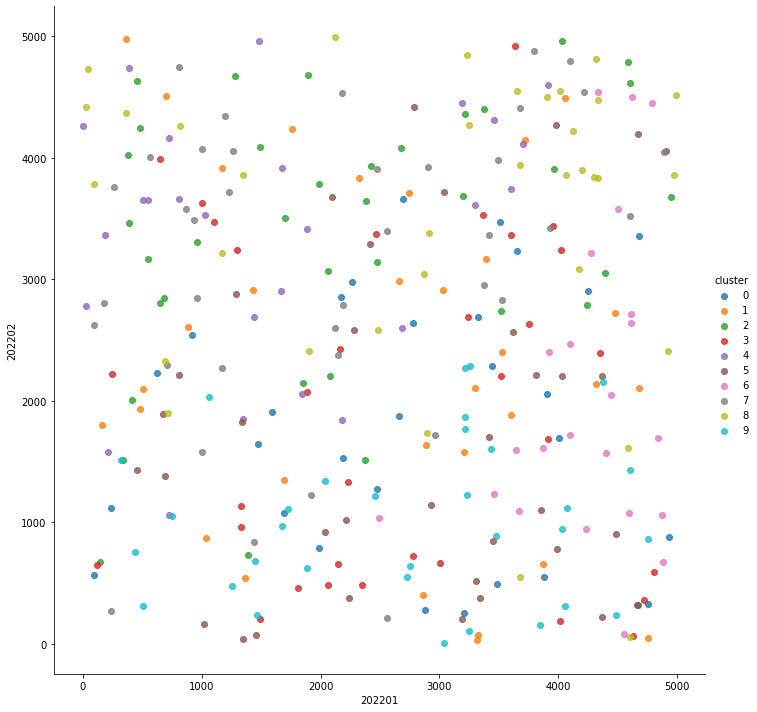

In [25]:
# Plot graph
sns.lmplot('202201', '202202', data = df, hue = 'cluster', size= 10, aspect = 1, fit_reg = False)

In [26]:
# Inertia get the sum of squared error for the cluster
# Checks how close the cluster points are
kmeans.inertia_

5576639997.542367

In [27]:
# K-Means score added to column
kmeans.score

<bound method KMeans.score of KMeans(n_clusters=10)>

In [28]:
df

,Borough,Major Category,202201,202202,202203,202204,202205,202206,202207,202208,202209,202210,202211,202212,cluster
0,Barking and Dagenham,0,2379,3641,2334,2823,3859,2785,4767,520,3682,1513,4290,2211,2
1,Barking and Dagenham,1,3716,4144,3949,4485,4775,1616,1975,2327,589,2872,3899,4082,1
2,Barking and Dagenham,2,3530,2831,4644,840,395,3514,3630,2194,4602,791,1395,49,7
3,Barking and Dagenham,3,3253,4271,4447,893,2109,2080,1603,168,1774,4326,4613,124,8
4,Barking and Dagenham,4,4347,2392,3040,3747,940,3076,1369,1426,4873,4270,2949,3346,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
315,Westminster,5,2777,2644,35,1585,1591,2310,3446,2285,3313,4989,3200,405,0
316,Westminster,6,415,2005,3709,3333,2471,4876,3107,309,3106,638,1505,4845,2
317,Westminster,7,4017,190,4037,1656,2969,4258,428,1418,1216,3045,4445,2328,3
318,Westminster,8,693,2324,882,4411,1387,2410,3263,65,124,2104,3501,2140,8


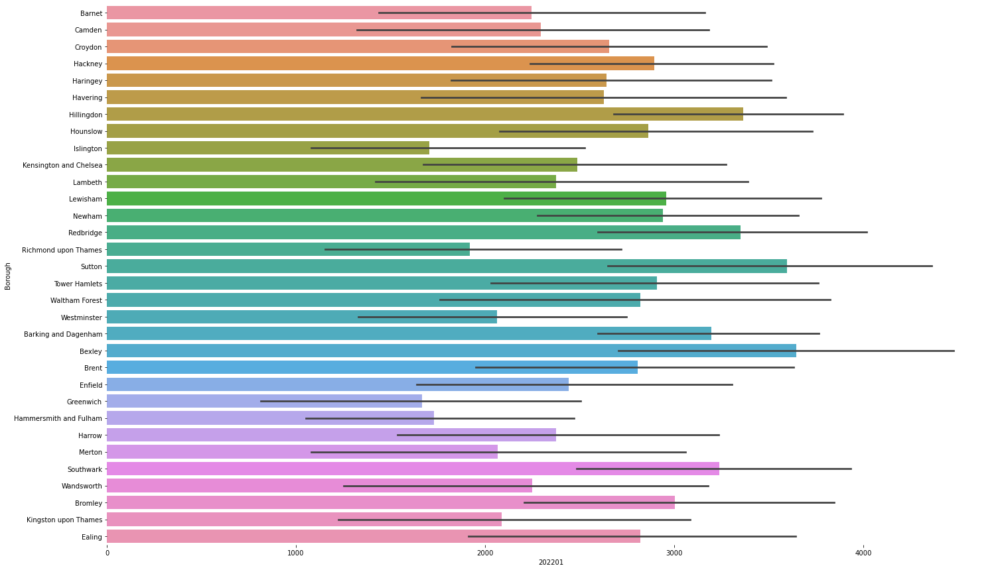

In [29]:
# Display bar plot
f, ax = plt.subplots(figsize = (24, 15))

# Load the data
stats = df.sort_values(['cluster', 'Borough'], ascending = True)
sns.set_color_codes('pastel')
sns.barplot(y = 'Borough', x = '202201', data = stats)

sns.despine(left = True, bottom = True)

In [30]:
# Split dataset for testing and training
X = df.iloc[:,1:15]
y = df.iloc[:,df.columns=='cluster']

In [31]:
# Print out headers
print(X.head())
y.head()

   Major Category  202201  202202  202203  202204  202205  202206  202207  \
0               0    2379    3641    2334    2823    3859    2785    4767   
1               1    3716    4144    3949    4485    4775    1616    1975   
2               2    3530    2831    4644     840     395    3514    3630   
3               3    3253    4271    4447     893    2109    2080    1603   
4               4    4347    2392    3040    3747     940    3076    1369   

   202208  202209  202210  202211  202212  cluster  
0     520    3682    1513    4290    2211        2  
1    2327     589    2872    3899    4082        1  
2    2194    4602     791    1395      49        7  
3     168    1774    4326    4613     124        8  
4    1426    4873    4270    2949    3346        3  


,cluster
0,2
1,1
2,7
3,8
4,3


In [32]:
# Split data for training and testing
from sklearn.model_selection import train_test_split

# Dividing dataset to training and testing data
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.2, random_state = 0)

In [34]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier

# Creating an instance of Random Forest
random_forest = RandomForestClassifier(n_estimators = 100)

# Creating test and training data
random_forest.fit(X_train, y_train)

y_pred = random_forest.predict(X_test)

# Get report scores
from sklearn.metrics import accuracy_score, classification_report
acc = accuracy_score(y_pred, y_test)
print("Accuracy: ", acc)

# Calculate classification
clf = classification_report(y_pred, y_test)
print(clf)

C:\Users\dong\AppData\Local\Temp\ipykernel_4796\1096128782.py:8: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  random_forest.fit(X_train, y_train)


Accuracy:  1.0
              precision    recall  f1-score   support

           0       1.00      1.00      1.00         4
           1       1.00      1.00      1.00         6
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00         5
           4       1.00      1.00      1.00         6
           5       1.00      1.00      1.00         9
           6       1.00      1.00      1.00         8
           7       1.00      1.00      1.00         7
           8       1.00      1.00      1.00         7
           9       1.00      1.00      1.00         4

    accuracy                           1.00        64
   macro avg       1.00      1.00      1.00        64
weighted avg       1.00      1.00      1.00        64



In [35]:
# Use Logistic Regression
from sklearn.linear_model import LogisticRegression

# Create an instance of logistic regression
lg = LogisticRegression()

# Fitting the training data
lg.fit(X_train, y_train)

# Calculate prediction
predic = lg.predict(X_test)

# Get accuracy score
acc2 = accuracy_score(predic, y_test)
print("Accuracy: ", acc2)

# Get classification score
clf2 = classification_report(predic, y_test)
print(clf2)

Accuracy:  0.703125
              precision    recall  f1-score   support

           0       0.50      0.67      0.57         3
           1       0.67      0.44      0.53         9
           2       0.62      0.83      0.71         6
           3       0.40      0.50      0.44         4
           4       0.67      1.00      0.80         4
           5       0.78      0.88      0.82         8
           6       0.75      0.75      0.75         8
           7       0.86      0.86      0.86         7
           8       1.00      0.88      0.93         8
           9       0.50      0.29      0.36         7

    accuracy                           0.70        64
   macro avg       0.67      0.71      0.68        64
weighted avg       0.71      0.70      0.69        64



C:\Users\dong\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dong\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [36]:
from sklearn.neighbors import KNeighborsClassifier

# Create a KNN classifier with k=5
knn = KNeighborsClassifier(n_neighbors=10)

# Train the classifier on the training set
knn.fit(X_train, y_train)

# Use the classifier to predict the labels of the test set
y_pred = knn.predict(X_test)

# Evaluate the accuracy of the classifier on the test set
acc3 = accuracy_score(y_test, y_pred)
print("Accuracy:", acc3)

# Get classification
clf3 = classification_report(y_pred, y_test)
print(clf3)

Accuracy: 0.703125
              precision    recall  f1-score   support

           0       1.00      0.57      0.73         7
           1       0.83      0.71      0.77         7
           2       0.75      0.86      0.80         7
           3       0.60      0.60      0.60         5
           4       0.67      0.67      0.67         6
           5       0.33      0.75      0.46         4
           6       0.25      1.00      0.40         2
           7       1.00      0.54      0.70        13
           8       1.00      1.00      1.00         7
           9       1.00      0.67      0.80         6

    accuracy                           0.70        64
   macro avg       0.74      0.74      0.69        64
weighted avg       0.83      0.70      0.73        64



C:\Users\dong\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


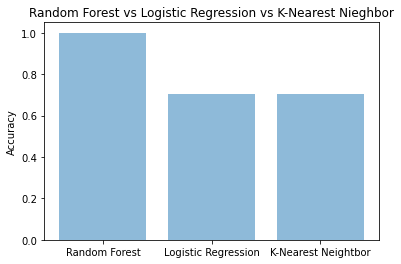

In [37]:
# Compare the results of all different ML Algorithms

# Create label to plot on graph
objects = ('Random Forest', 'Logistic Regression', 'K-Nearest Neightbor')
y_pos = np.arange(len(objects))
performance = [acc, acc2, acc3]

plt.bar(y_pos, performance, align = 'center', alpha = 0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Accuracy')
plt.title('Random Forest vs Logistic Regression vs K-Nearest Nieghbor')
plt.show()

In [38]:
from sklearn.metrics import confusion_matrix

# Generate the confusion matrix for knn
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)

Confusion matrix:
[[4 0 0 0 0 0 0 0 0 0]
 [0 5 0 0 0 1 0 0 0 0]
 [2 0 6 0 0 0 0 0 0 0]
 [0 0 0 3 0 0 0 2 0 0]
 [1 0 0 0 4 0 0 0 0 1]
 [0 0 0 1 1 3 0 4 0 0]
 [0 2 1 1 1 0 2 0 0 1]
 [0 0 0 0 0 0 0 7 0 0]
 [0 0 0 0 0 0 0 0 7 0]
 [0 0 0 0 0 0 0 0 0 4]]


In [39]:
# Create a Random Forest classifier with n_estimators=100
rf = RandomForestClassifier(n_estimators=100)

# Train the classifier on the training set
rf.fit(X_train, y_train)

# Use the classifier to predict the labels of the test set
y_pred = rf.predict(X_test)

# Generate the confusion matrix for random forest
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)


C:\Users\dong\AppData\Local\Temp\ipykernel_4796\218229121.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(X_train, y_train)


Confusion matrix:
[[4 0 0 0 0 0 0 0 0 0]
 [0 6 0 0 0 0 0 0 0 0]
 [0 0 8 0 0 0 0 0 0 0]
 [0 0 0 5 0 0 0 0 0 0]
 [0 0 0 0 6 0 0 0 0 0]
 [0 0 0 0 0 9 0 0 0 0]
 [0 0 0 0 0 0 8 0 0 0]
 [0 0 0 0 0 0 0 7 0 0]
 [0 0 0 0 0 0 0 0 7 0]
 [0 0 0 0 0 0 0 0 0 4]]


In [40]:
# Create a logistic regression classifier with default parameters
lr = LogisticRegression()

# Train the classifier on the training set
lr.fit(X_train, y_train)

# Use the classifier to predict the labels of the test set
y_pred = lr.predict(X_test)

# Generate the confusion matrix logistic regression
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)


Confusion matrix:
[[2 1 0 0 0 0 0 0 0 1]
 [0 4 0 0 0 0 0 0 0 2]
 [0 0 5 1 0 1 1 0 0 0]
 [0 1 0 2 0 0 0 0 0 2]
 [1 0 0 0 4 0 0 0 1 0]
 [0 1 0 0 0 7 0 1 0 0]
 [0 2 0 0 0 0 6 0 0 0]
 [0 0 1 0 0 0 0 6 0 0]
 [0 0 0 0 0 0 0 0 7 0]
 [0 0 0 1 0 0 1 0 0 2]]


C:\Users\dong\anaconda3\lib\site-packages\sklearn\utils\validation.py:993: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dong\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
